In [1]:
import torch
import torchvision.models as models
from torch.utils.data import Dataset
import os
import pandas as pd
from torchvision.io import read_image
from torchvision import transforms
from torch.nn import CrossEntropyLoss
import matplotlib.pyplot as plt
from torch.utils.data import DataLoader, random_split, Subset, ConcatDataset
import torch.nn as nn
from PIL import Image
from torchvision.transforms.functional import InterpolationMode
import numpy as np
import math
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

In [3]:
class OxfordIIITPetDataset(Dataset):
    @staticmethod
    def extract_breed(name):
        return ' '.join(name.split("_")[:-1]).lower().title()

    def __init__(self, img_dir, transform=None, transform_label=None):
        self.img_dir = img_dir
        self.image_names = [img_name for img_name in os.listdir(img_dir) if img_name.endswith('.jpg')]
        self.transform = transform
        self.transform_label = transform_label
        self.labels = list(set([self.extract_breed(name) for name in self.image_names]))
        self.labels_to_idx = {item: idx for idx, item in enumerate(self.labels)}
        self.values = {}

    def __len__(self):
        return len(self.image_names)
    
    def set_prediction(self, idx, value):
        self.values[idx] = value
    
    def unset_prediction(self, idx):
        if idx in self.values:
            del self.values[idx]

    def get_label(self, idx):
        image_name = self.image_names[idx]
        label = self.extract_breed(image_name)
        return label

    def __getitem__(self, idx):
        image_name = self.image_names[idx]
        img_path = os.path.join(self.img_dir, image_name)
        image = Image.open(img_path).convert('RGB')
        real_label = self.extract_breed(image_name)
        real_label = self.labels_to_idx[real_label]
        label = real_label
        if idx in self.values:
            label = self.values[idx]
        
        if self.transform:
            image = self.transform(image)
        if self.transform_label:
            label = self.transform_label(label)
        return image, label, idx, real_label
    
    def random_split_equal_distribution(self, split_ratios):
        assert sum(split_ratios) == 1.0, "Split ratios must sum to 1"

        label_indices = {label: [] for label in self.labels}

        # Group indices by label
        for idx in range(len(self)):
            label = self.get_label(idx)
            label_indices[label].append(idx)

        sub_indices = [[] for _ in range(len(split_ratios))]
        datasets = [None for _ in range(len(split_ratios))]

        # Shuffle indices within each label group and create subsets
        for label, indices in label_indices.items():
            np.random.shuffle(indices)
            num_samples = len(indices)
            start_idx = 0

            for i, ratio in enumerate(split_ratios):
                end_idx = start_idx + int(ratio * num_samples)
                sub_indices[i].extend(indices[start_idx:end_idx])
                start_idx = end_idx
            
        for i in range(len(split_ratios)):    
            datasets[i] = Subset(self, sub_indices[i])


        return datasets

In [4]:
transform = transforms.Compose([
    transforms.Resize((256, 256), interpolation=InterpolationMode.BILINEAR),
    transforms.CenterCrop((224, 224)), 
    transforms.RandomHorizontalFlip(p=0.2),
    transforms.ColorJitter(brightness=0.2, contrast=0.2),
    transforms.RandomRotation(degrees=15),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

In [5]:
dt = OxfordIIITPetDataset(img_dir='./Dataset/images', transform=transform)
l_dt, u_dt, t_dt = dt.random_split_equal_distribution([0.4, 0.4, 0.2])

In [6]:
def histogram_of_features(dataset, name):
# Initialize an empty dictionary to store the counts of each label
    label_counts = {}

    # Iterate through the dataset to count the occurrences of each label
    for i in range(len(dataset)):
        label = dataset.dataset.get_label(i)
        label = str(label)
        if label not in label_counts:
            label_counts[label] = 0
        label_counts[label] += 1

    # Extract labels and counts from the dictionary
    labels = list(label_counts.keys())
    counts = list(label_counts.values())

    # Plot the histogram
    plt.figure(figsize=(10, 6))
    plt.bar(labels, counts, color='skyblue')
    plt.xlabel('Labels')
    plt.ylabel('Counts')
    plt.title('Histogram of Labels in the Dataset %s' % name)
    plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better visibility
    plt.tight_layout()
    plt.show()

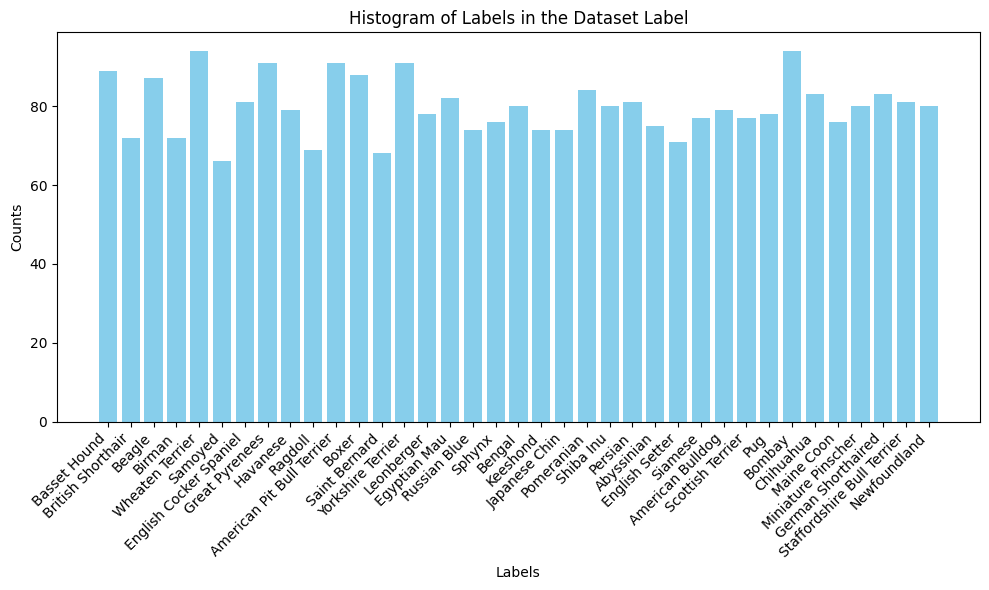

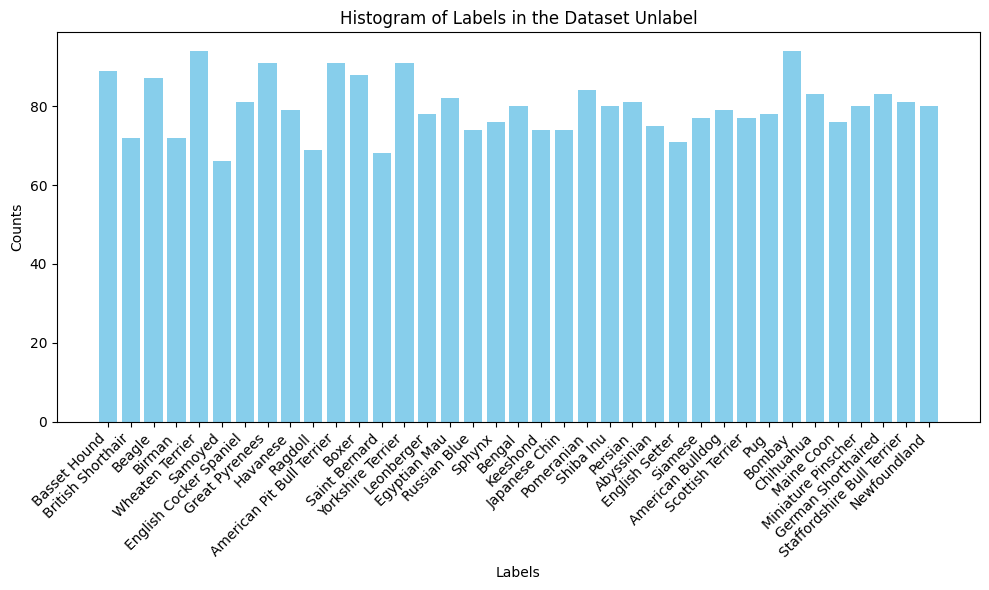

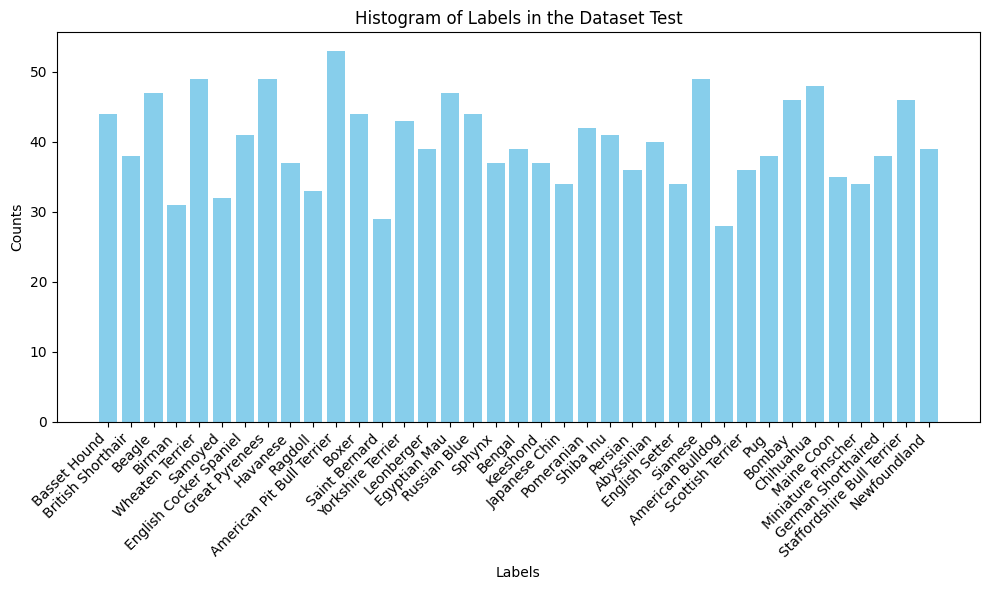

In [7]:
histogram_of_features(l_dt, 'Label')
histogram_of_features(u_dt, 'Unlabel')
histogram_of_features(t_dt, 'Test')

In [8]:
def build_model(n_features, extra_layers=[], enable_batch_norm=False): # None to get the same as previous, int size of the layer
    pretrained_model = models.resnet18(weights="IMAGENET1K_V1")

    for parameter in pretrained_model.parameters():
        parameter.requires_grad = False

    new_layers = []
    previous = pretrained_model.fc.in_features
    for m in extra_layers:
        if m is None:
            m = previous
        new_layers.append(nn.Linear(previous, m))
        if enable_batch_norm:
            new_layers.append(nn.BatchNorm1d(m))
        new_layers.append(nn.ReLU(inplace=True))
        previous = m

    new_layers.append(nn.Linear(previous, n_features))
    if enable_batch_norm:
        new_layers.append(nn.BatchNorm1d(n_features))


    pretrained_model.fc = nn.Sequential(*new_layers)
    return pretrained_model

In [9]:
def test_accuracy(model, test_loader: DataLoader, save_name=None):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    correct = 0
    total = 0
    model.eval()
    all_predictions = []
    all_labels = []

    with torch.no_grad():
        for inputs, labels, _, _ in test_loader:
            inputs = inputs.to(device)  # Move inputs to device (CPU or GPU)
            labels = labels.to(device)  # Move labels to device (CPU or GPU)
            
            # Forward pass
            outputs = model(inputs)
            
            # Get predictions
            _, predicted = torch.max(outputs, 1)

            all_labels.extend(labels.cpu().numpy())
            all_predictions.extend(predicted.cpu().numpy())
            
            # Update counts
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
    
    # Calculate accuracy
    accuracy = correct / total

    if save_name is not None:
        cm = confusion_matrix(all_labels, all_predictions, labels=list(range(len(test_loader.dataset.dataset.labels))))
        cmd = ConfusionMatrixDisplay(cm, display_labels=test_loader.dataset.dataset.labels)
        fig, ax = plt.subplots(figsize=(20,20))
        cmd.plot(ax=ax)
        plt.xticks(rotation=45, ha='right')
        directory = os.path.dirname(save_name)
        if not os.path.exists(directory):
            os.makedirs(directory)
        plt.savefig(save_name, format='svg', bbox_inches='tight')
        plt.show()
    
    return accuracy

In [10]:
def train_model(model: OxfordIIITPetDataset, train_loader: DataLoader, optimizer, epochs, scheduler=None):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model.to(device)
    learning_rates = []

    loss_func = nn.CrossEntropyLoss()
    for epoch in range(epochs):  # loop over the dataset multiple times
        model.train()

        ii = 1
        i = 0

        running_loss = 0.0
        for inputs, labels, _, _ in train_loader:
            inputs = inputs.to(device)
            labels = labels.to(device)
            
            # zero the parameter gradients
            optimizer.zero_grad()

            # forward + backward + optimize
            outputs = model(inputs)
            loss = loss_func(outputs, labels)
            loss.backward()
            optimizer.step()
            if scheduler is not None:
                scheduler.step()
            
            lr = optimizer.param_groups[0]['lr']
            learning_rates.append(lr)

            # print statistics
            running_loss += loss.item()
            i += train_loader.batch_size
            if i >= 2000:    # print every 2000 mini-batches
                print(f'[{epoch + 1}, {i * ii:5d}] loss: {running_loss / 2000:.3f}')
                i = 0
                ii += 1
                running_loss = 0.0
        if i > 0:
            print(f'[{epoch + 1}, {2000 * ii + i:5d}] loss: {running_loss / 2000:.3f}')


    print('Finished Training')
    return learning_rates

In [11]:
def predict_unlabeled_data(model: OxfordIIITPetDataset, unlabel_dl, dataset, threshold, save_name=None):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model.eval()
    all_predictions = []
    all_labels = []
    no_threshold = len(dataset.labels)
    labaled_data = []

    with torch.no_grad():
        for inputs, _, idx, labels in unlabel_dl:
            inputs = inputs.to(device)  # Move inputs to device (CPU or GPU)
            labels = labels.to(device)  # Move labels to device (CPU or GPU)
            
            # Forward pass
            outputs = model(inputs)

            probabilities = nn.functional.softmax(outputs, dim=1)
            
            # Get predictions
            max_probabilities, predicted = torch.max(probabilities, 1)

            all_labels.extend(labels.cpu().numpy())


            for i in range(len(predicted)):
                if max_probabilities[i].item() >= threshold:
                    dataset.set_prediction(idx[i].item(), predicted[i].item())
                    all_predictions.append(predicted[i].item())
                    labaled_data.append(idx[i].item())
                else:
                    dataset.unset_prediction(idx[i].item())
                    all_predictions.append(no_threshold)
    cm = confusion_matrix(all_labels, all_predictions, labels=list(range(no_threshold + 1)))
    cmd = ConfusionMatrixDisplay(cm, display_labels=dataset.labels + ["No threshold"])
    fig, ax = plt.subplots(figsize=(20,20))
    cmd.plot(ax=ax)
    plt.xticks(rotation=45, ha='right')
    if save_name is not None:
        directory = os.path.dirname(save_name)
        if not os.path.exists(directory):
            os.makedirs(directory)
        plt.savefig(save_name, format='svg', bbox_inches='tight')
    plt.show()
    return labaled_data

In [12]:
def plot_accuracies(accuracies):
    plt.plot(range(1, len(accuracies) + 1), accuracies, marker='o', linestyle='-')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.title('Accuracy over Epochs')
    plt.grid(True)
    plt.show()

def plot_lr(lr):
    plt.plot(lr, marker='o', linestyle='-')
    plt.xlabel('Updates steps')
    plt.ylabel('Learning rate')
    plt.title('Learning rate over Updates steps')
    plt.grid(True)
    plt.show()

In [13]:
def main(extra_layers, unlabeled_percentage=0, epochs=5, sched=None, enable_batch_norm=False, prediction_threshold=0):
    unlabeled_percentage = 0.8 * unlabeled_percentage
    dataset = OxfordIIITPetDataset(img_dir='./Dataset/images', transform=transform)
    label_dataset, unlabel_dataset, test_dataset = dataset.random_split_equal_distribution([0.8 - unlabeled_percentage, unlabeled_percentage, 0.2])
    label_epochs = min(epochs, 5)
    label_batch = 50
    if (len(label_dataset) < 1000):
        label_epochs = 15
        label_batch = 100

    label_dl = DataLoader(label_dataset, batch_size=label_batch, shuffle=True)
    unlabel_dl = DataLoader(unlabel_dataset, batch_size=50, shuffle=True)
    test_dl = DataLoader(test_dataset, batch_size=25, shuffle=False)

    pretrained_model = build_model(n_features=len(label_dl.dataset.dataset.labels), extra_layers=extra_layers, enable_batch_norm=enable_batch_norm)

    optimizer = torch.optim.Adam(pretrained_model.parameters())

    scheduler = None

    if sched == 1:
        step_size = (len(label_dl.dataset) // label_dl.batch_size) // 2
        scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=step_size, gamma=0.9)

    learning_rates1 = train_model(pretrained_model, label_dl, optimizer, epochs=label_epochs, scheduler=scheduler)

    acc = test_accuracy(pretrained_model, test_dl)
    print('Accuracy on test data: %s' % acc)

    unlabeled_number = len(unlabel_dataset)
    unlabeled_labaled_indices = []
    i = 0

    while len(unlabeled_labaled_indices) < unlabeled_number:
        unlabeled_labaled_indices = predict_unlabeled_data(pretrained_model, unlabel_dl, dataset, threshold=prediction_threshold, save_name='./Pictures/%s/%s.svg' % (str(unlabeled_percentage).replace('.', '_'), i))

        train_dataset = Subset(dataset, indices=label_dataset.indices + unlabeled_labaled_indices)
        train_dl = DataLoader(train_dataset, batch_size=25, shuffle=True)
        
        learning_rates2 = train_model(pretrained_model, train_dl, optimizer, epochs=1, scheduler=scheduler)

        acc = test_accuracy(pretrained_model, test_dl)
        print('Accuracy on test data: %s' % acc)
        i += 1
    
    acc = test_accuracy(pretrained_model, test_dl, save_name='./Pictures/%s/final_test.svg' % (str(unlabeled_percentage).replace('.', '_')))

    if sched is not None:
        plot_lr(learning_rates1)
        plot_lr(learning_rates2)

[1,  2100] loss: 0.002
[2,  2100] loss: 0.002
[3,  2100] loss: 0.001
[4,  2100] loss: 0.001
[5,  2100] loss: 0.001
[6,  2100] loss: 0.001
[7,  2100] loss: 0.001
[8,  2100] loss: 0.001
[9,  2100] loss: 0.001
[10,  2100] loss: 0.000
[11,  2100] loss: 0.000
[12,  2100] loss: 0.000
[13,  2100] loss: 0.000
[14,  2100] loss: 0.000
[15,  2100] loss: 0.000
Finished Training
Accuracy on test data: 0.3392010832769127


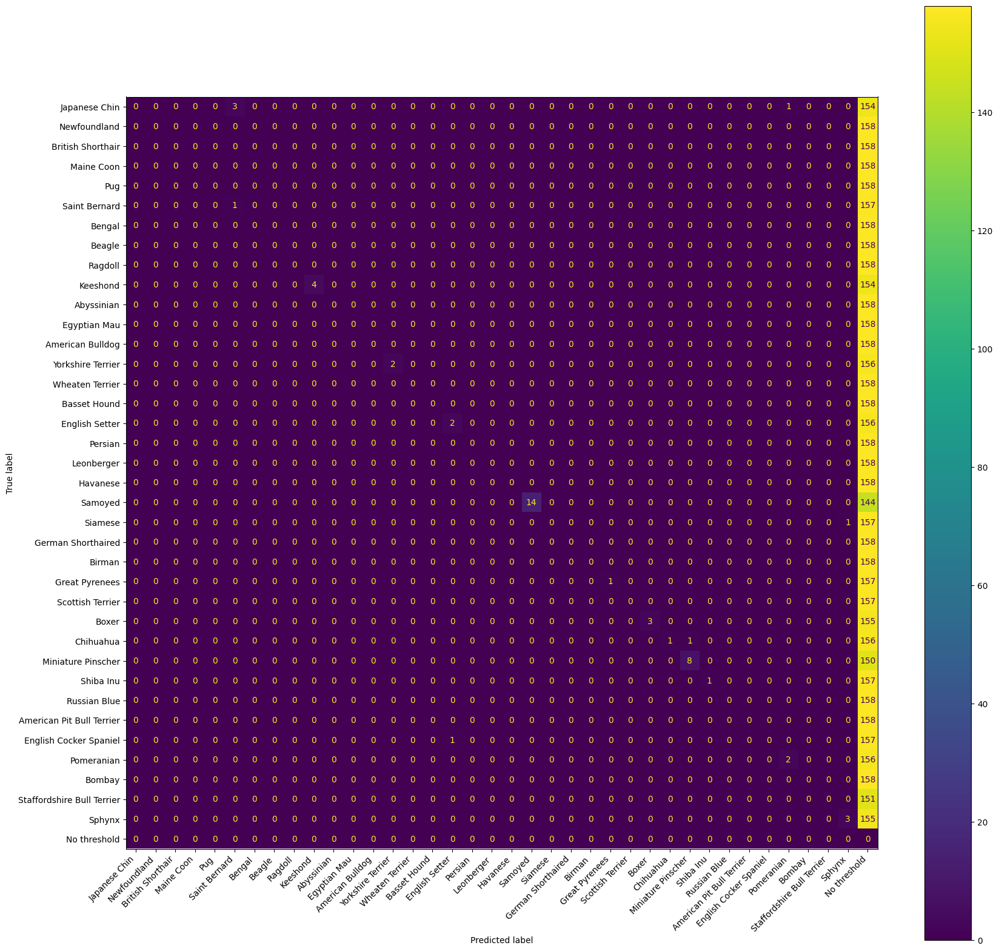

[1,  2100] loss: 0.003
Finished Training
Accuracy on test data: 0.36492890995260663


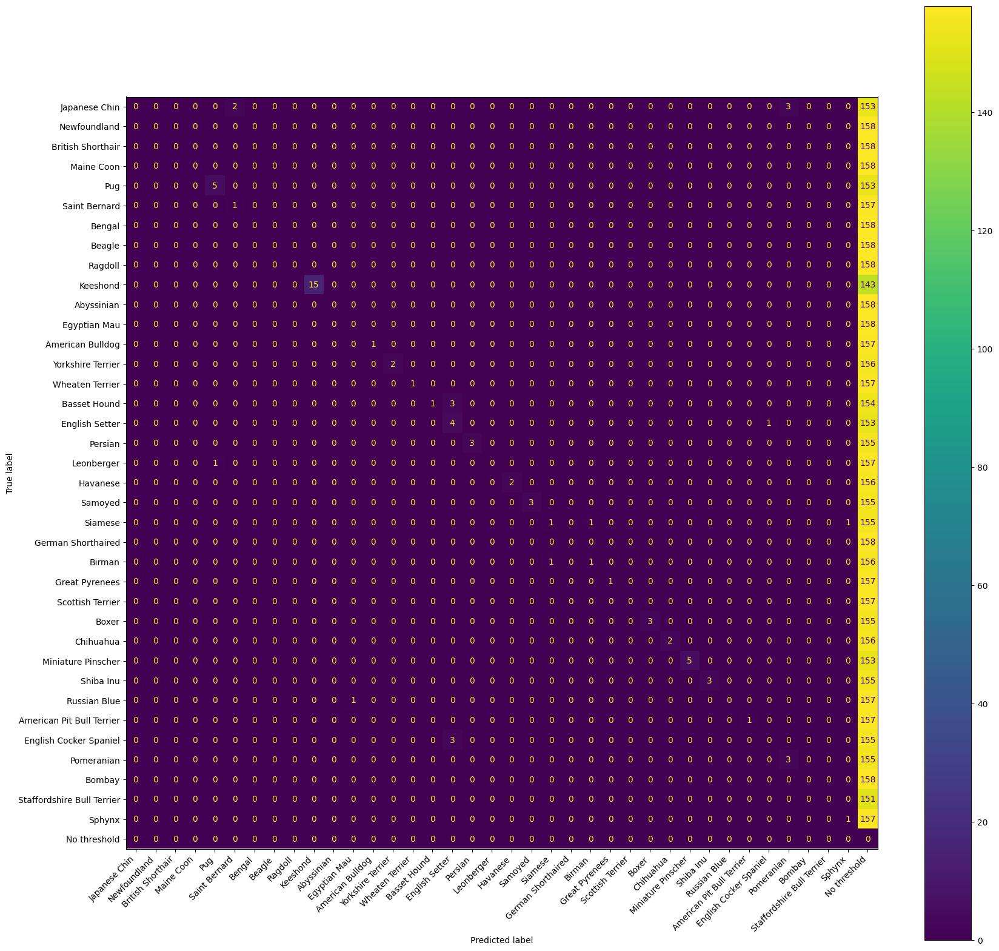

[1,  2125] loss: 0.004
Finished Training
Accuracy on test data: 0.3818551117129316


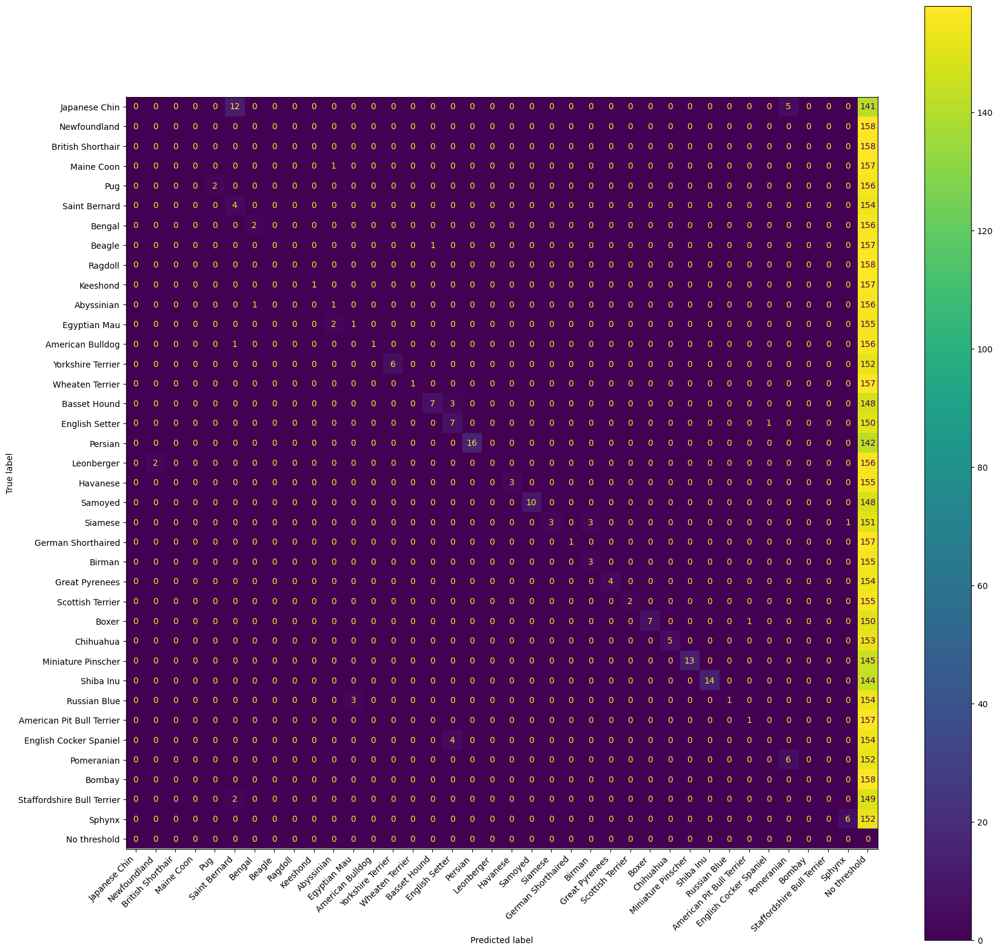

[1,  2225] loss: 0.006
Finished Training
Accuracy on test data: 0.4041976980365606


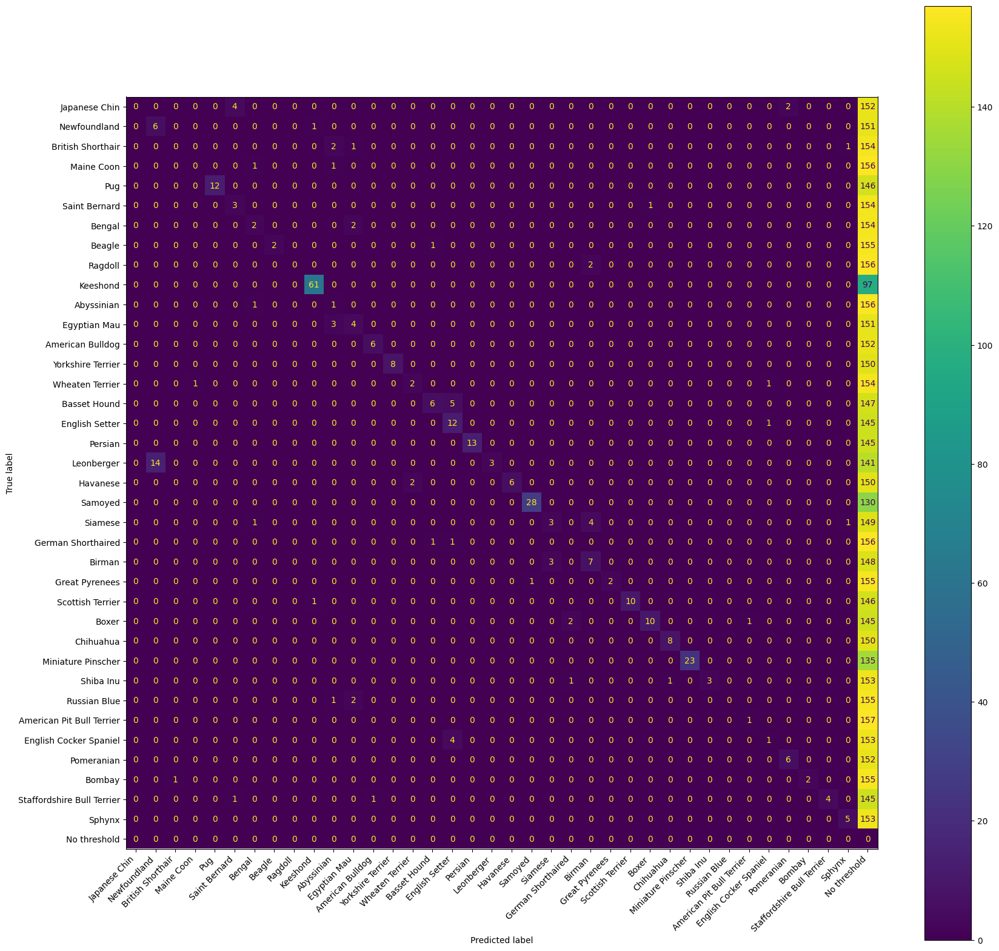

[1,  2375] loss: 0.010
Finished Training
Accuracy on test data: 0.43263371699390657


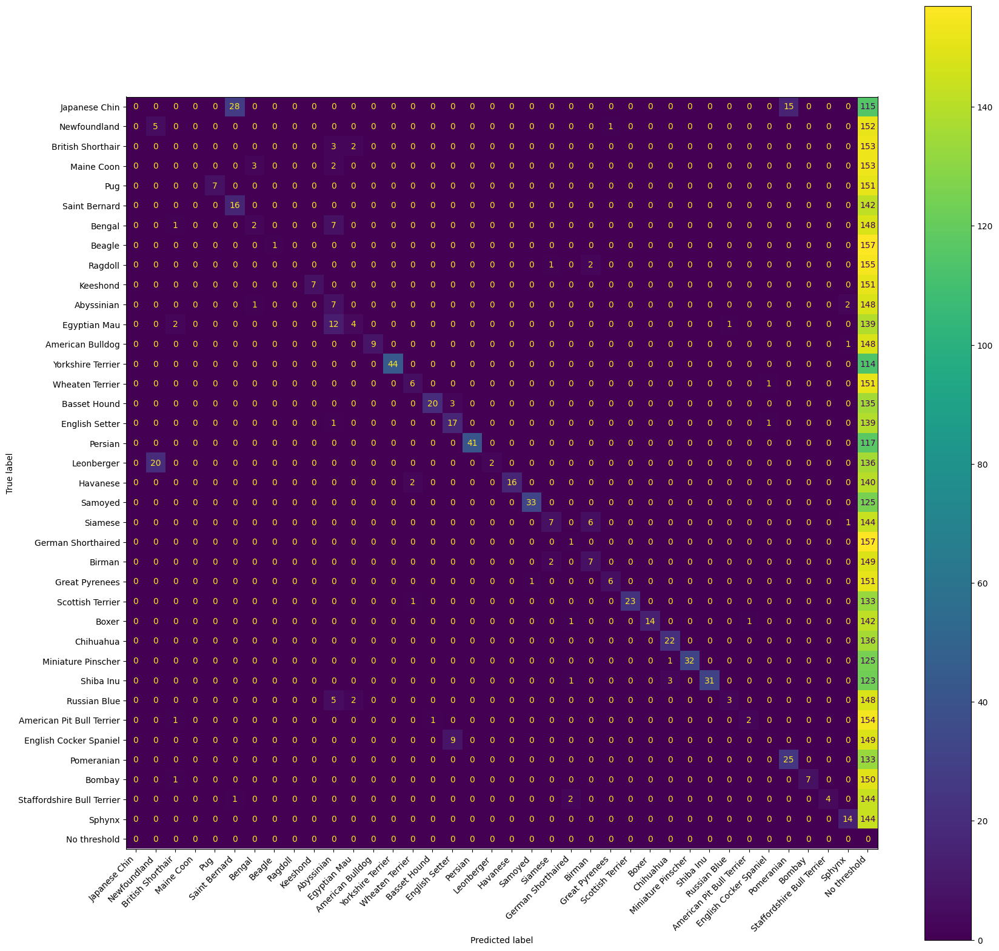

[1,  2625] loss: 0.017
Finished Training
Accuracy on test data: 0.46580907244414355


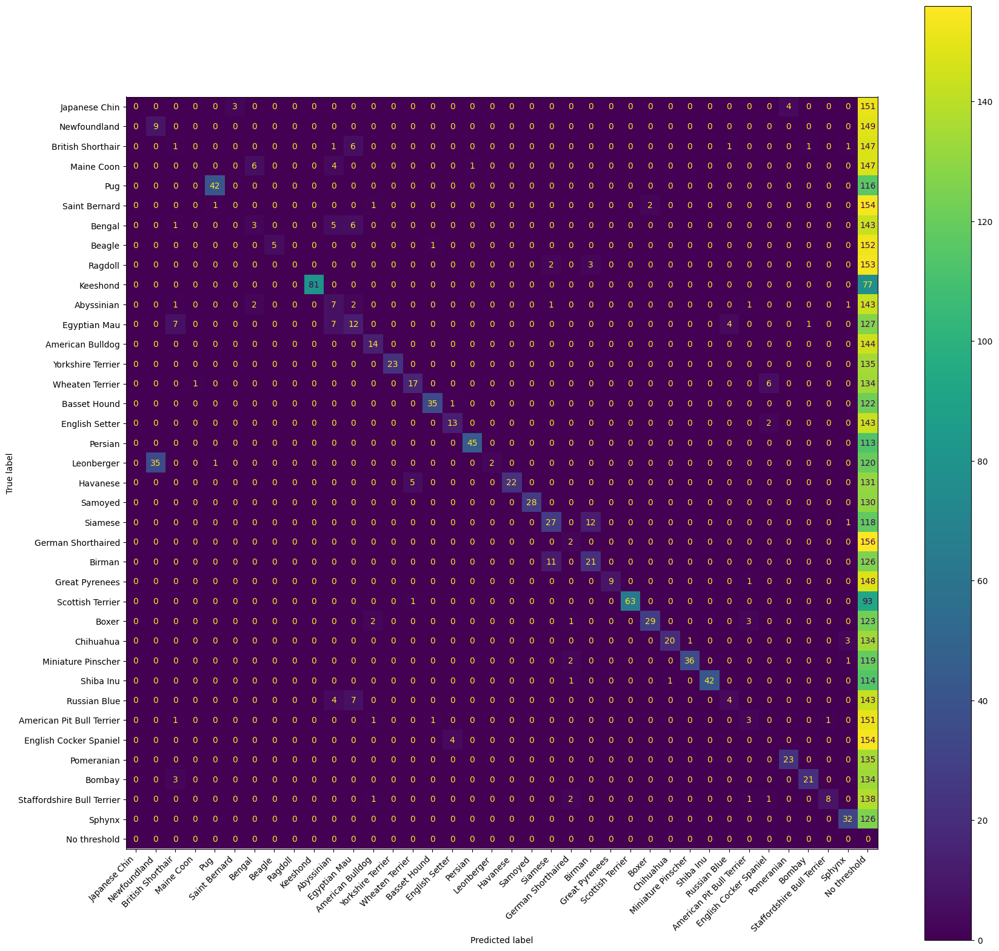

[1,  2950] loss: 0.024
Finished Training
Accuracy on test data: 0.5010155721056195


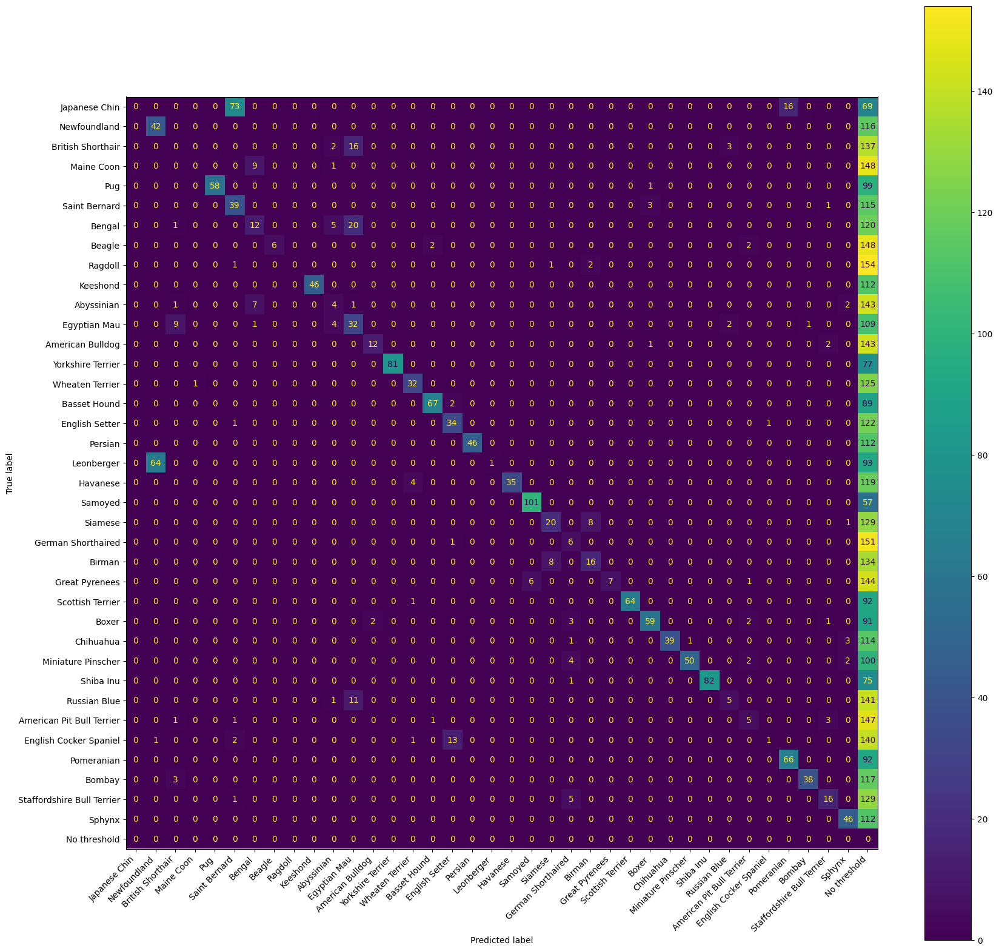

[1,  3575] loss: 0.036
Finished Training
Accuracy on test data: 0.5362220717670955


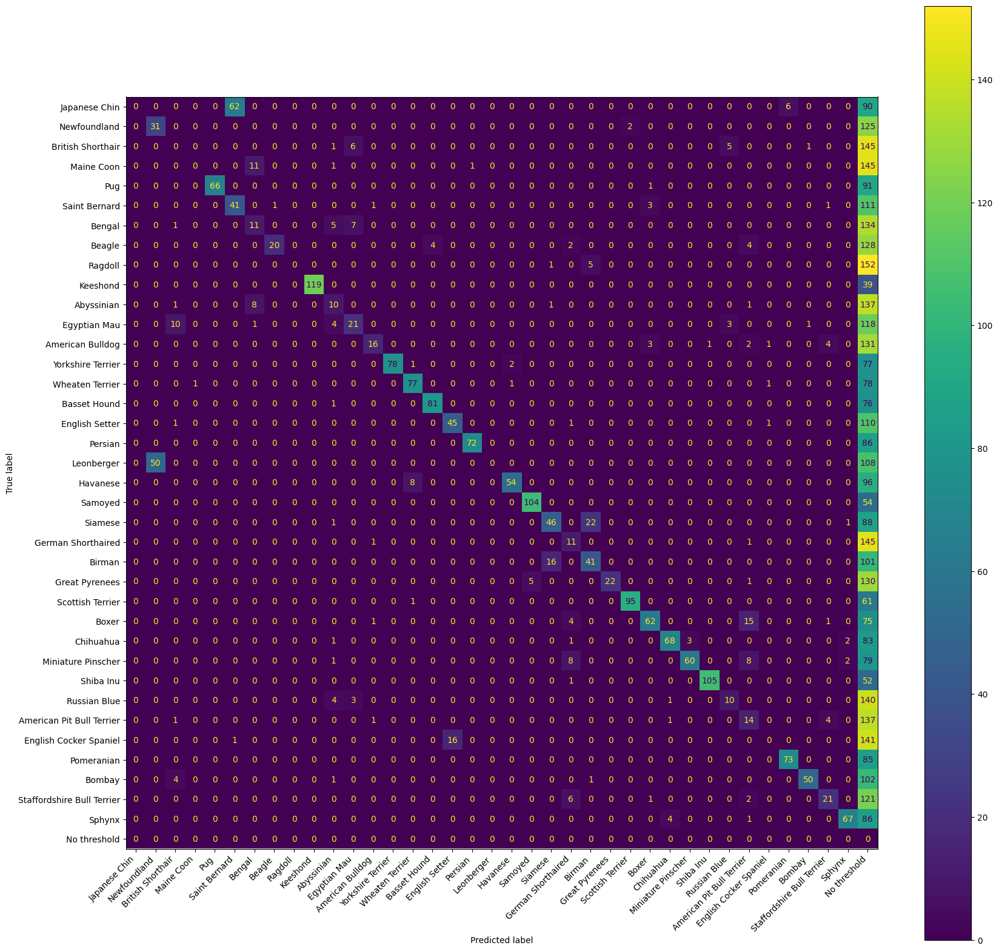

[1,  2000] loss: 0.040
[1,  4025] loss: 0.001
Finished Training
Accuracy on test data: 0.5457007447528774


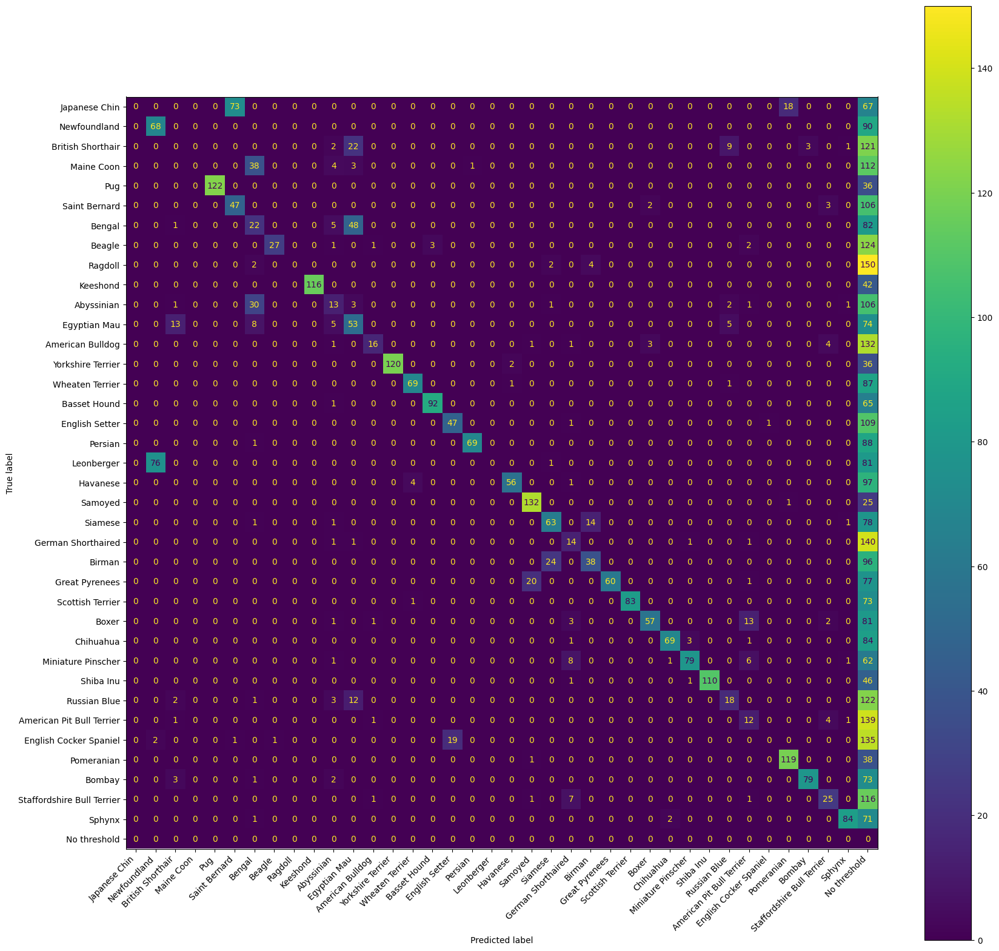

[1,  2000] loss: 0.038
[1,  4625] loss: 0.011
Finished Training
Accuracy on test data: 0.5775220040622884


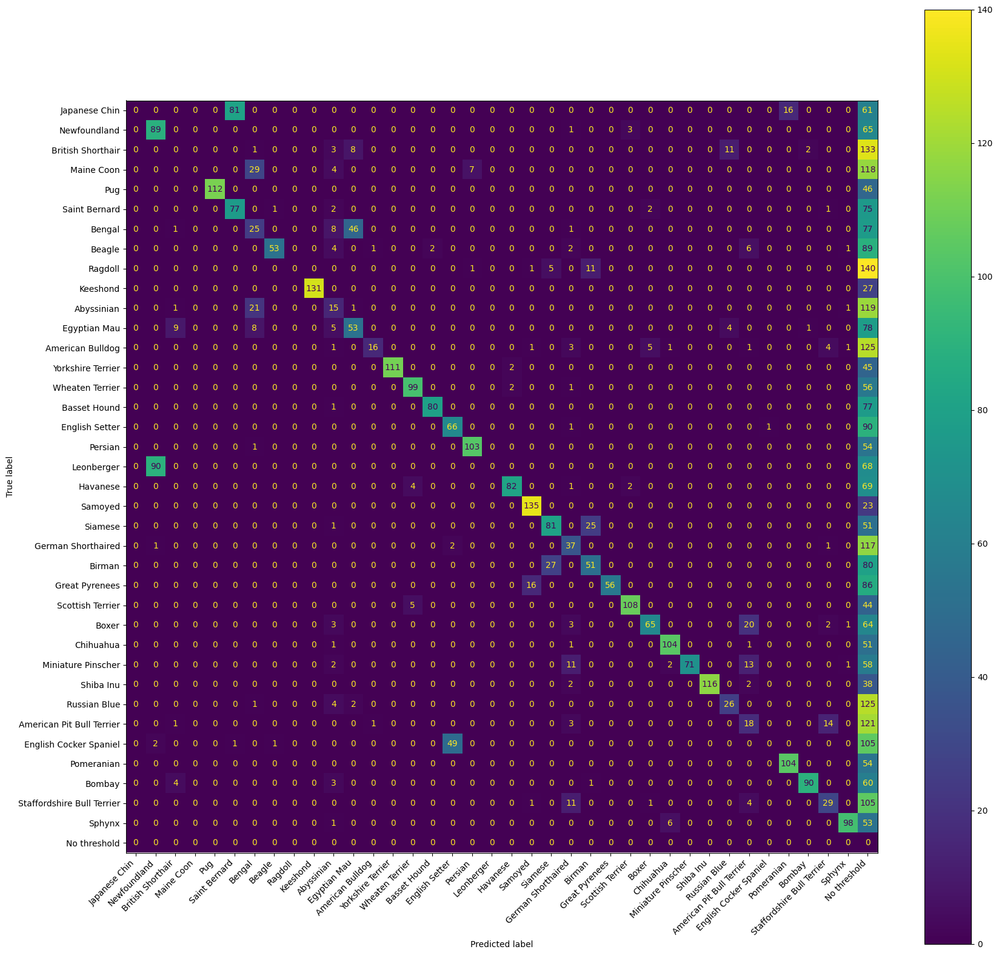

[1,  2000] loss: 0.035
[1,  5050] loss: 0.019
Finished Training
Accuracy on test data: 0.5971563981042654


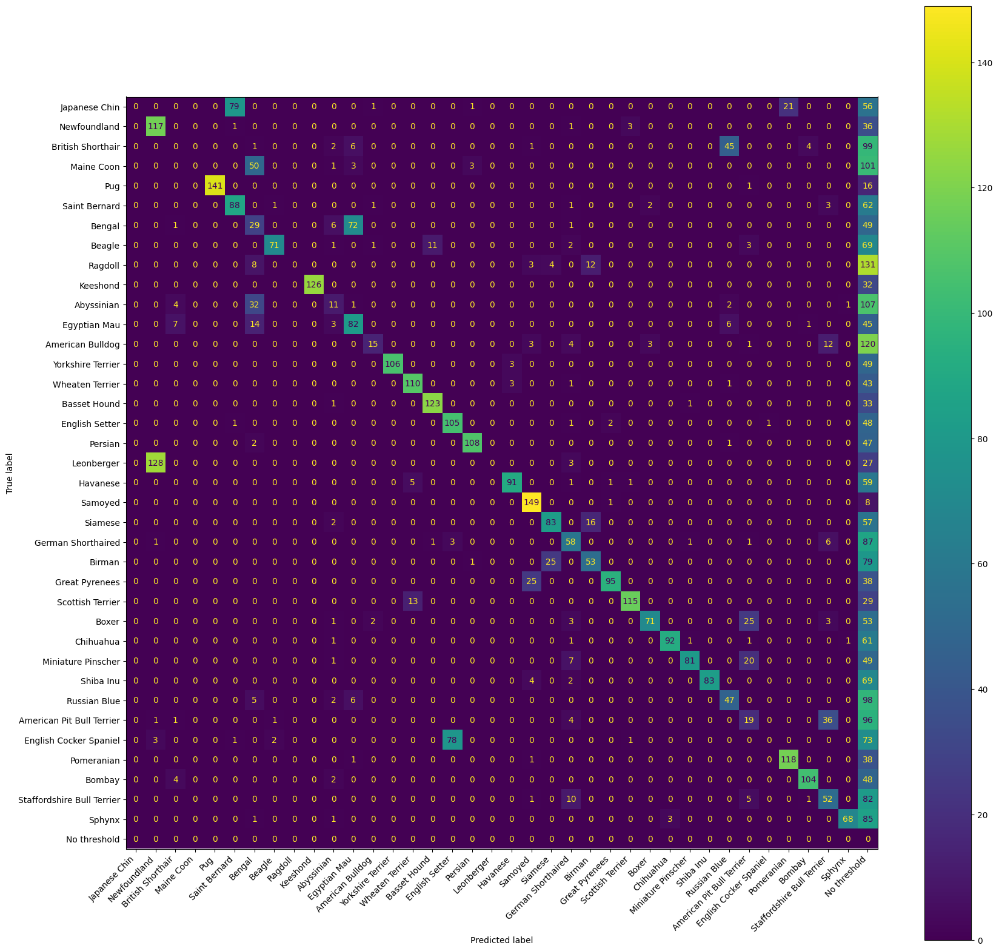

[1,  2000] loss: 0.035
[1,  5600] loss: 0.026
Finished Training
Accuracy on test data: 0.6093432633716994


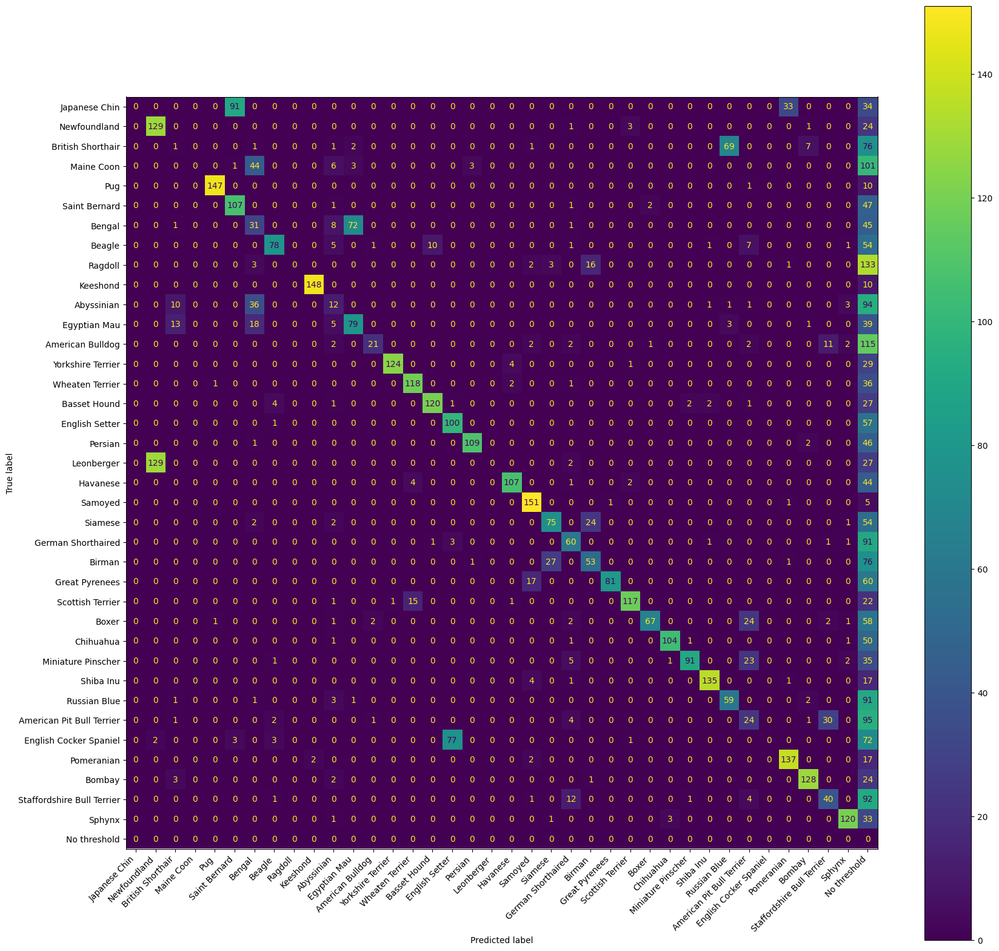

[1,  2000] loss: 0.031
[1,  5950] loss: 0.030
Finished Training
Accuracy on test data: 0.6194989844278944


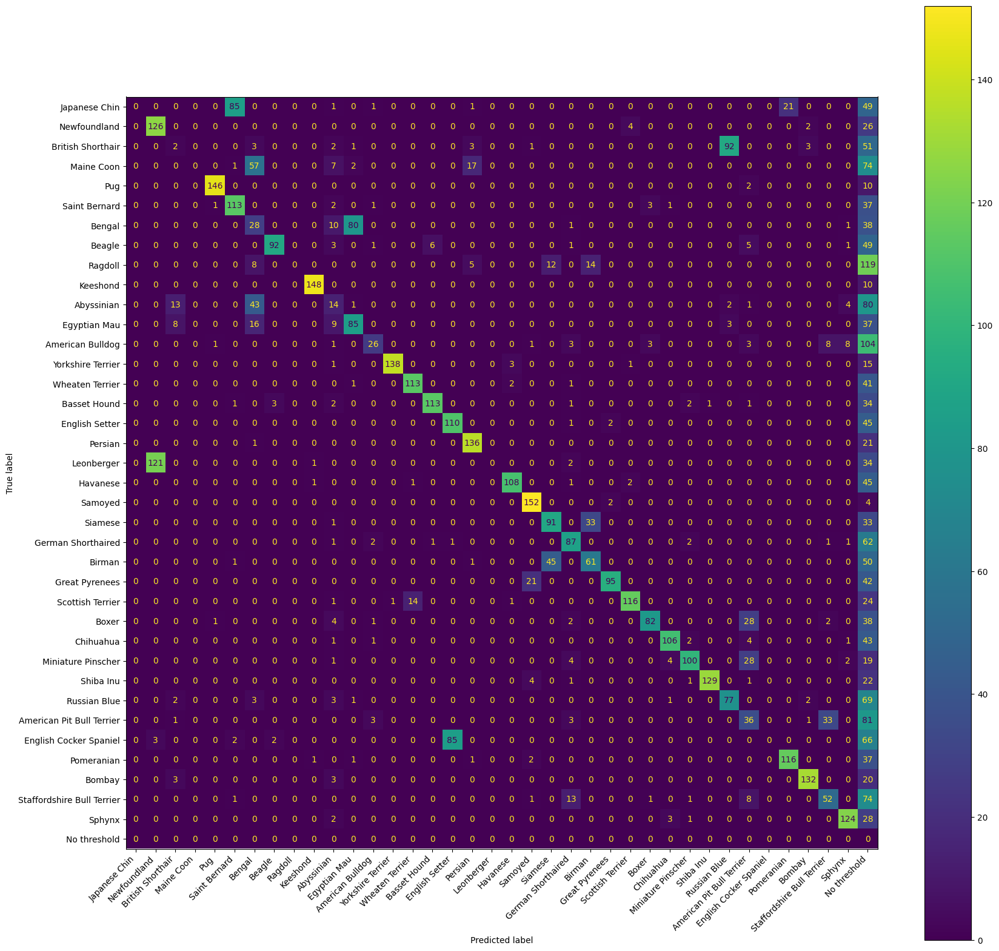

[1,  2000] loss: 0.030
[1,  4000] loss: 0.031
[1,  6250] loss: 0.004
Finished Training
Accuracy on test data: 0.6330399458361544


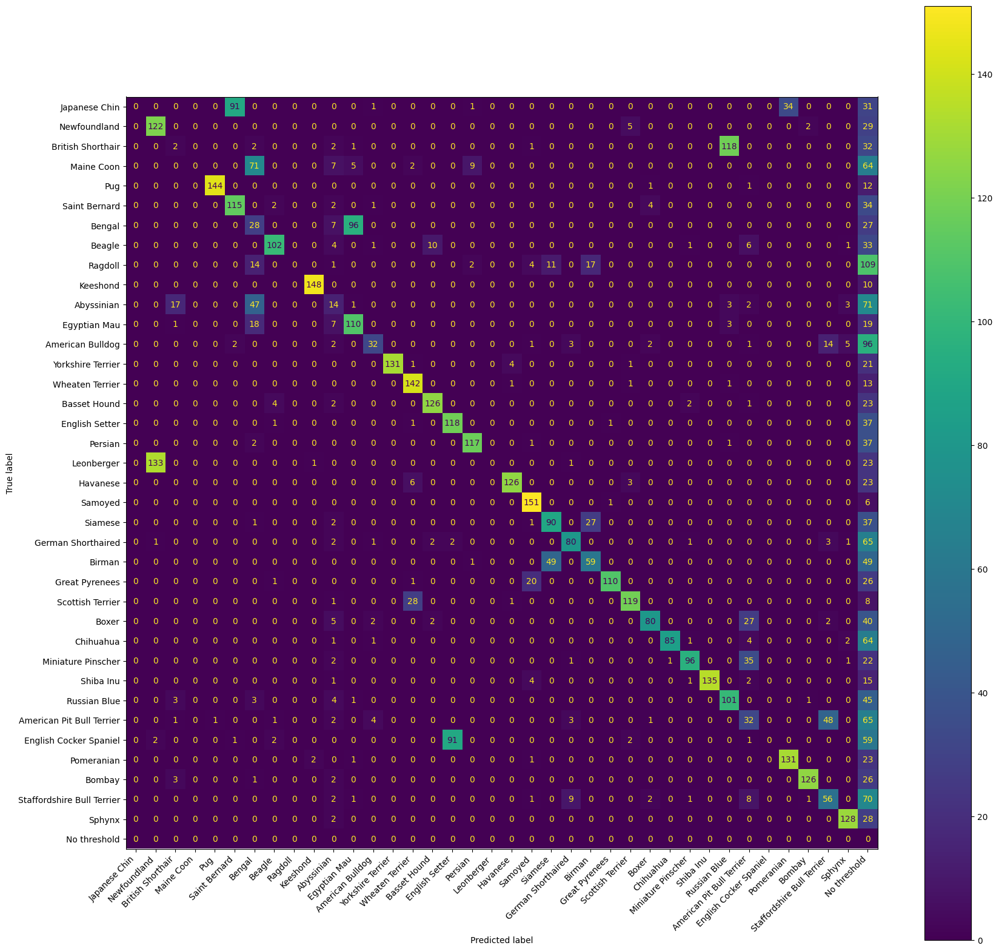

[1,  2000] loss: 0.029
[1,  4000] loss: 0.028
[1,  6500] loss: 0.008
Finished Training
Accuracy on test data: 0.6296547054840894


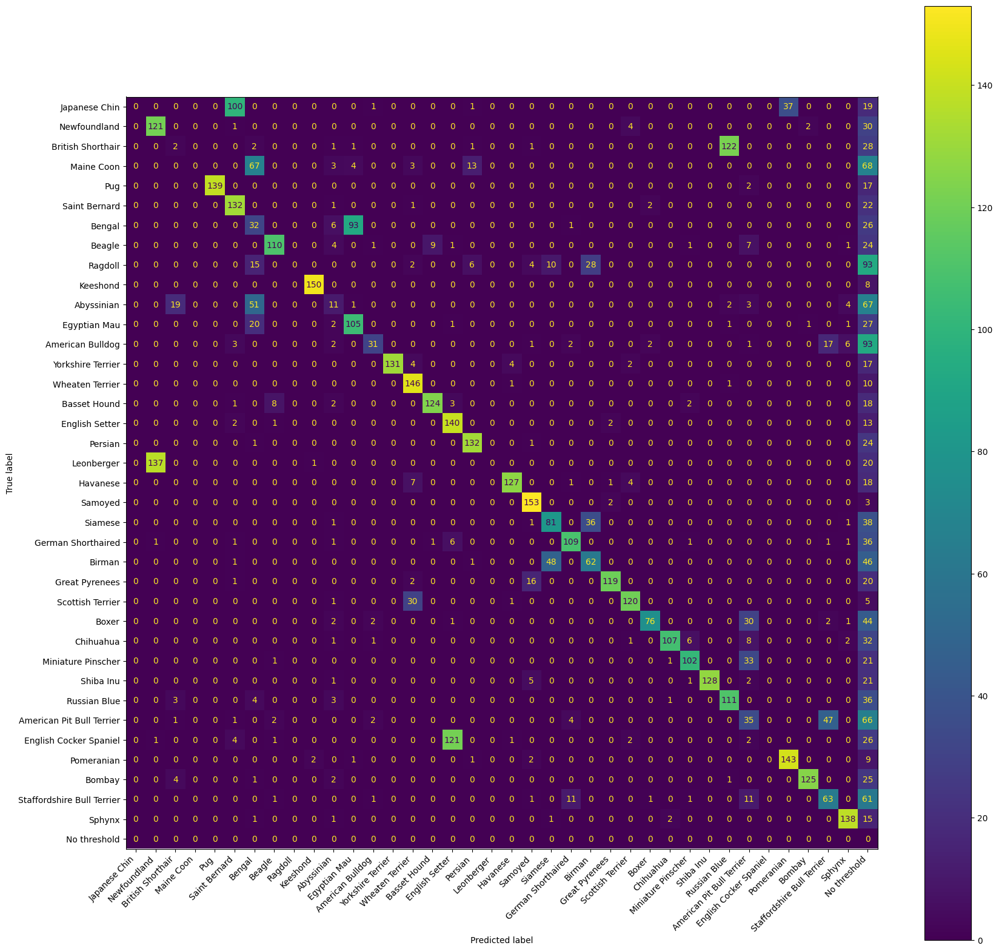

[1,  2000] loss: 0.027
[1,  4000] loss: 0.028
[1,  6750] loss: 0.011
Finished Training
Accuracy on test data: 0.6276235612728503


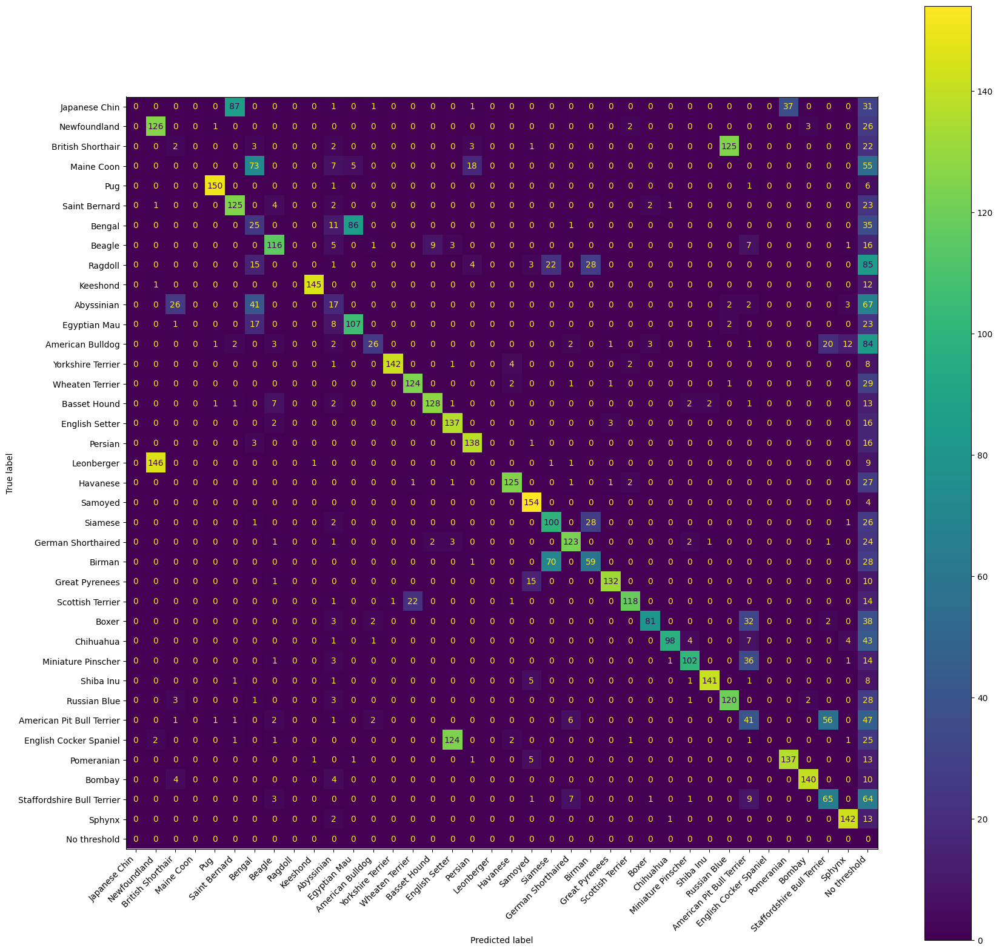

[1,  2000] loss: 0.027
[1,  4000] loss: 0.025
[1,  6875] loss: 0.011
Finished Training
Accuracy on test data: 0.6262694651320244


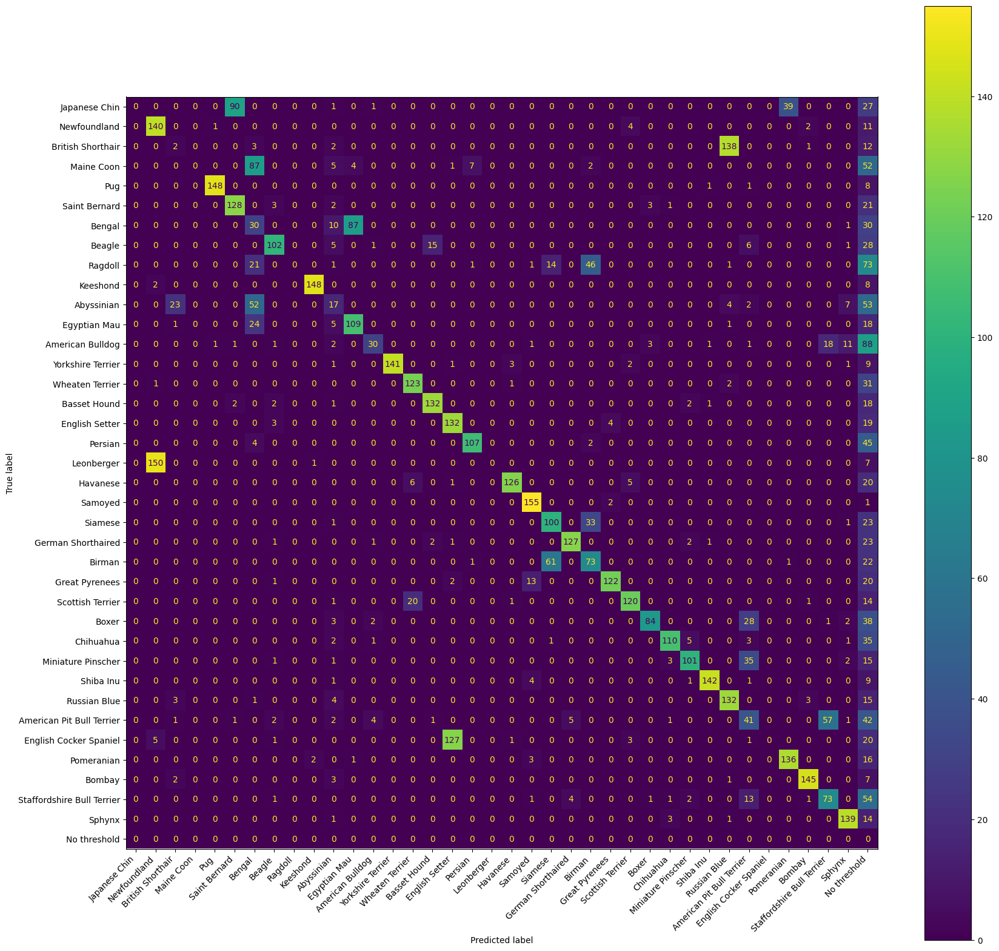

[1,  2000] loss: 0.026
[1,  4000] loss: 0.025
[1,  6950] loss: 0.013
Finished Training
Accuracy on test data: 0.6289776574136764


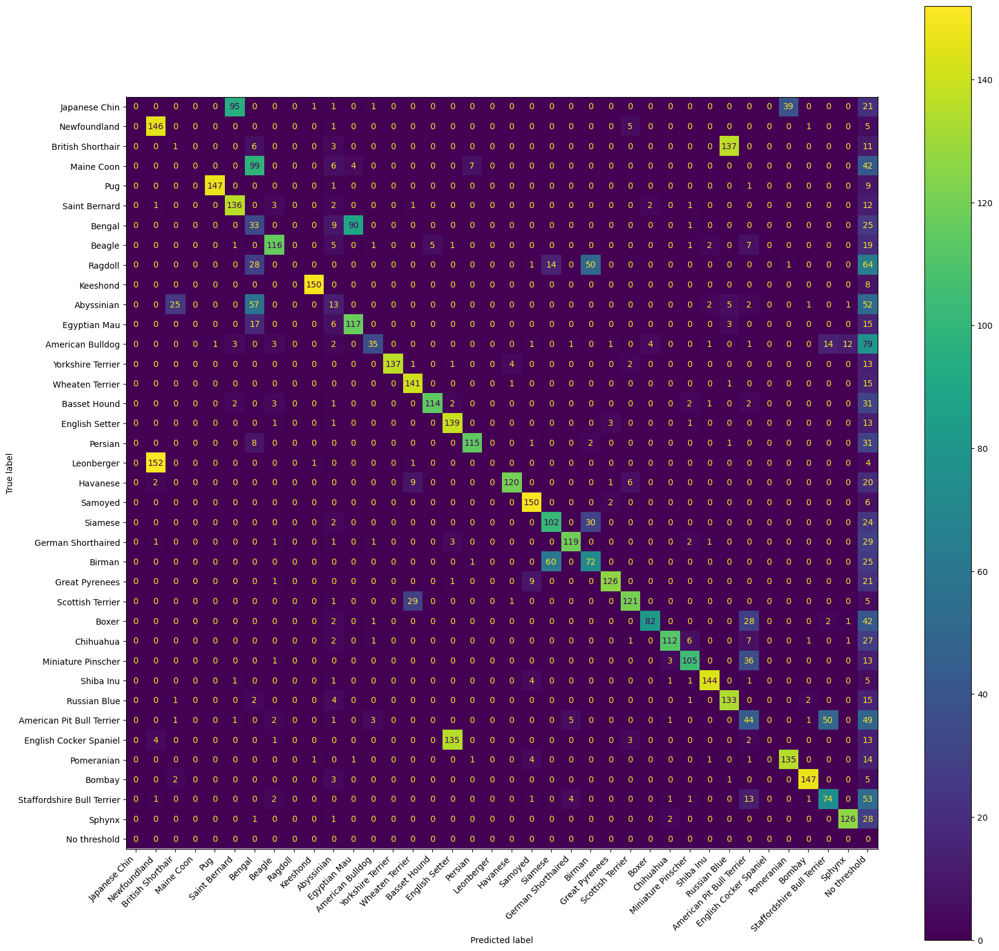

[1,  2000] loss: 0.024
[1,  4000] loss: 0.024
[1,  7025] loss: 0.012
Finished Training
Accuracy on test data: 0.6296547054840894


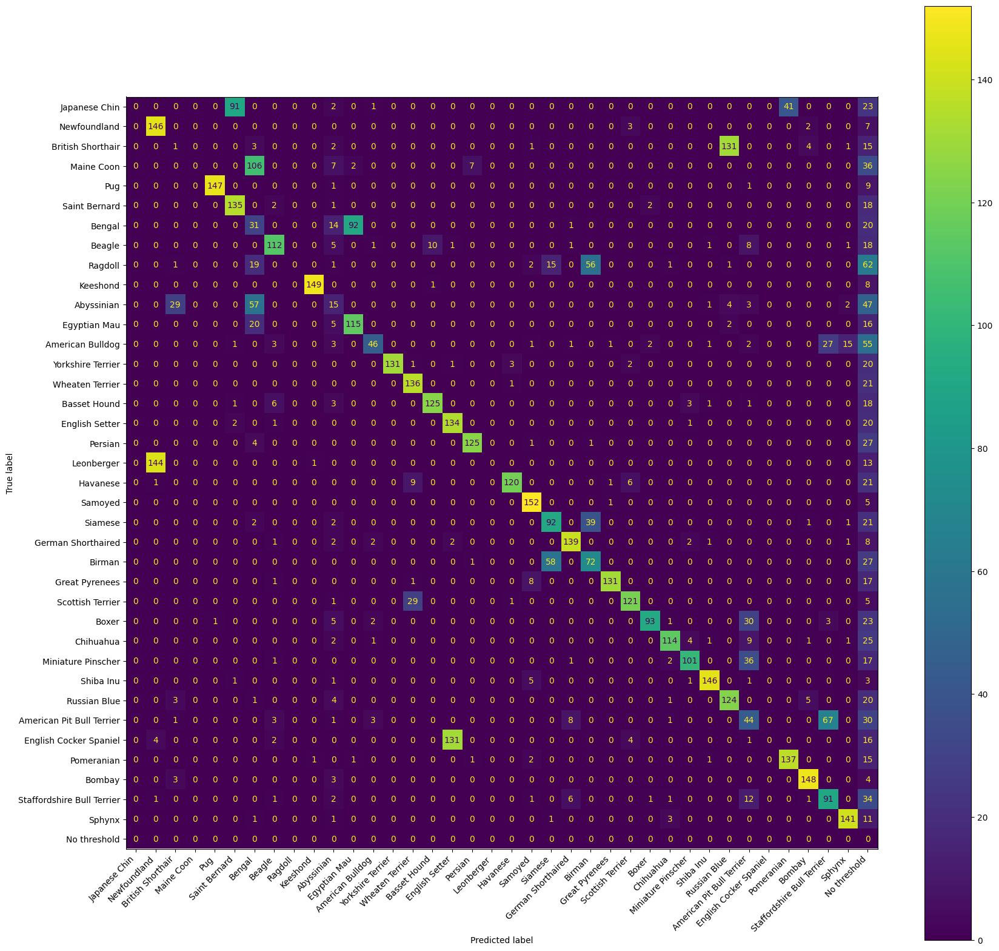

[1,  2000] loss: 0.025
[1,  4000] loss: 0.024
[1,  7125] loss: 0.013
Finished Training
Accuracy on test data: 0.6310088016249153


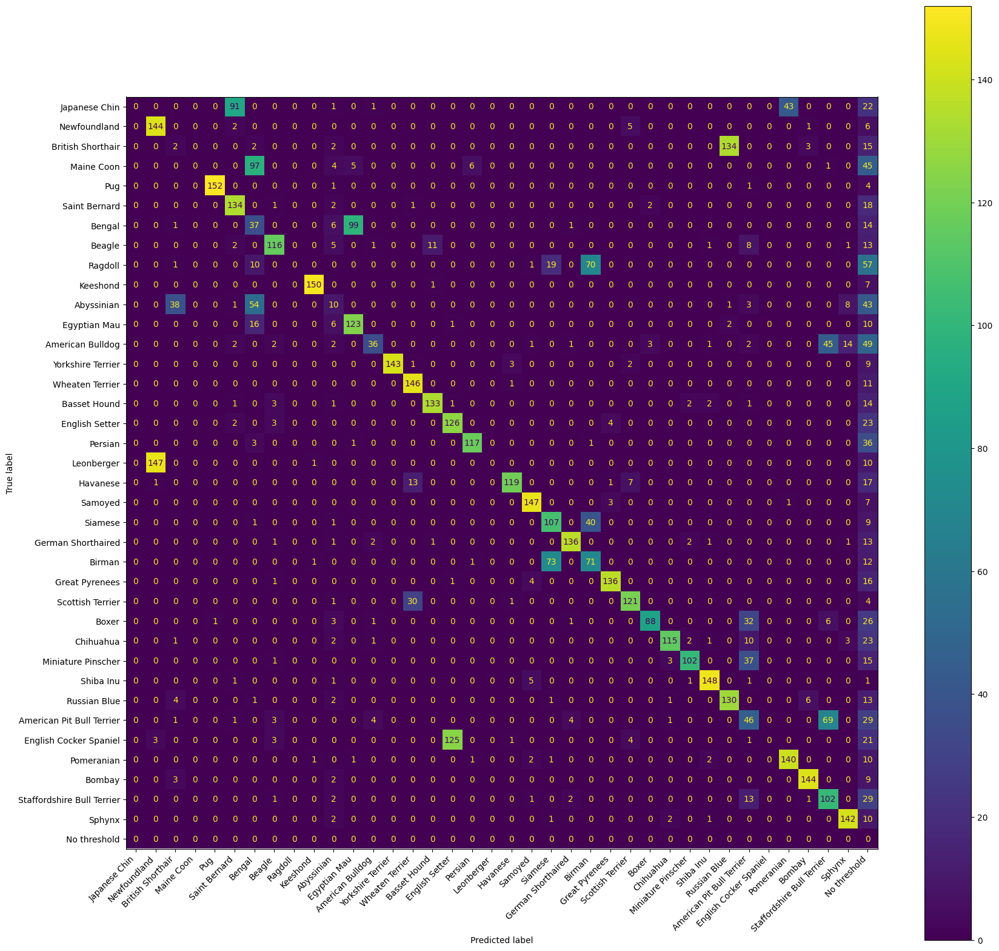

[1,  2000] loss: 0.023
[1,  4000] loss: 0.024
[1,  7225] loss: 0.014
Finished Training
Accuracy on test data: 0.6377792823290453


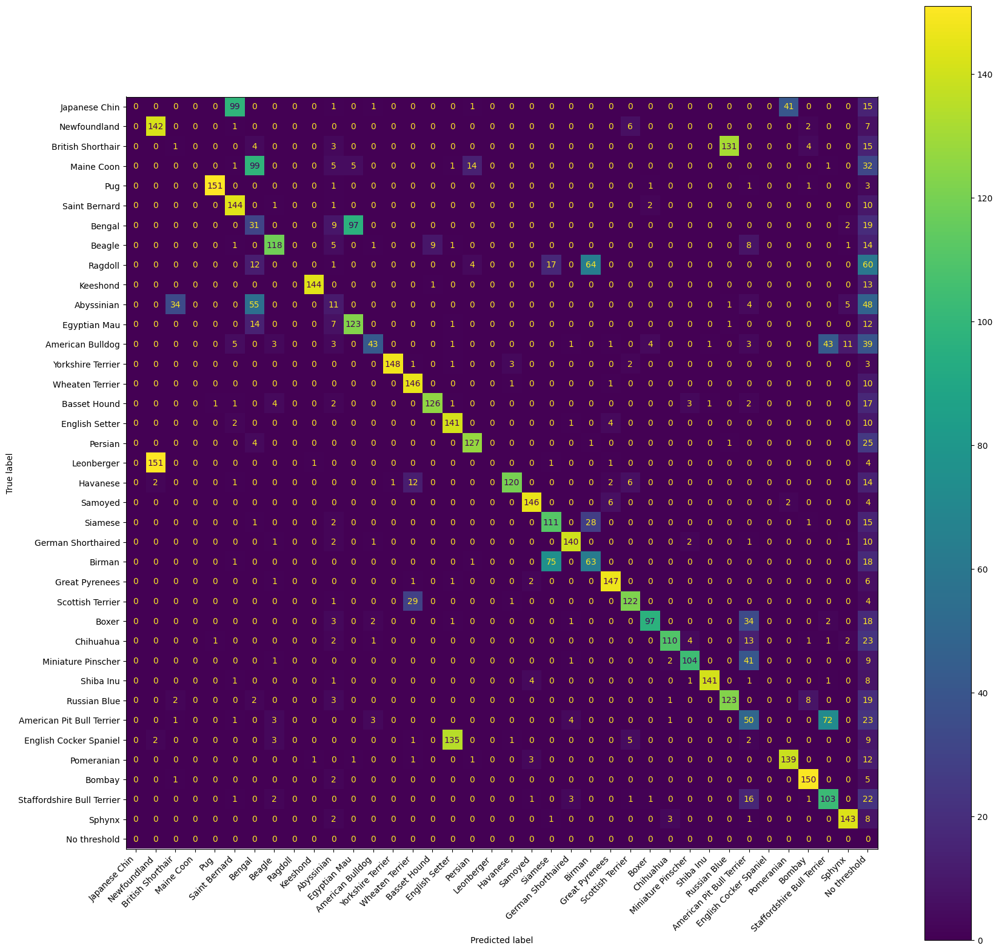

[1,  2000] loss: 0.022
[1,  4000] loss: 0.023
[1,  7300] loss: 0.015
Finished Training
Accuracy on test data: 0.6452268111035884


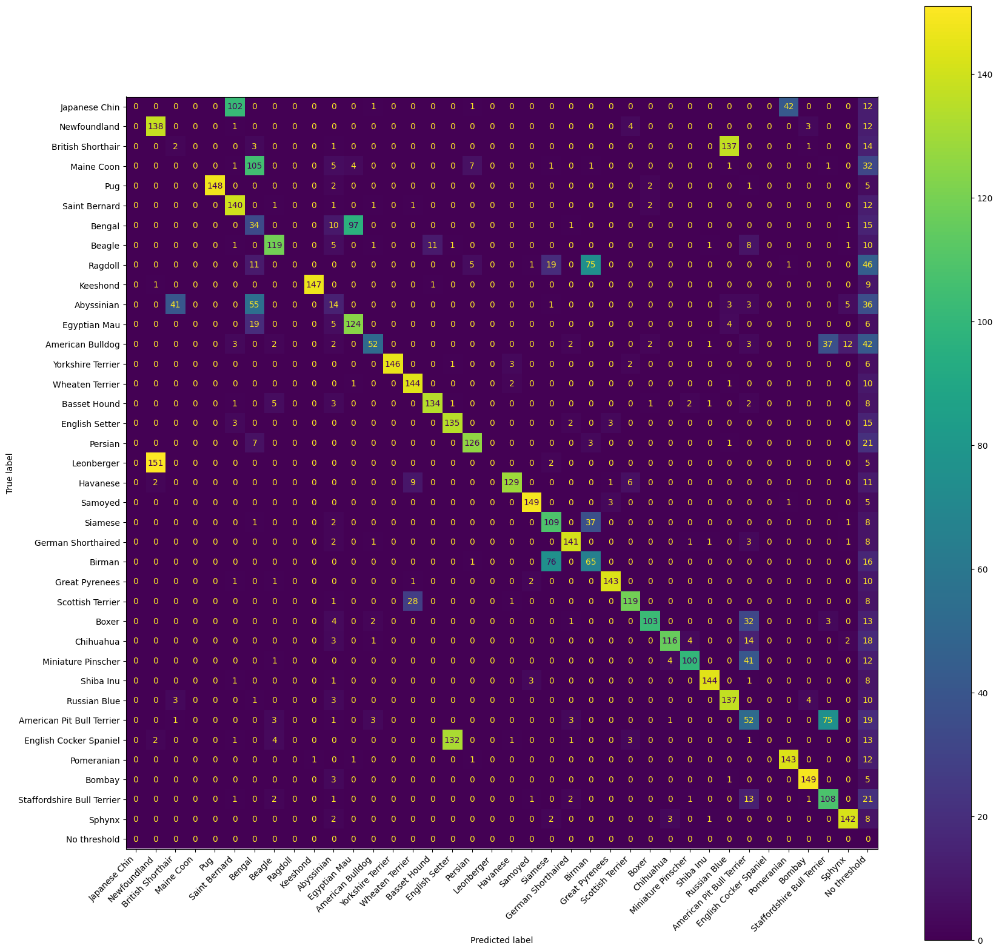

[1,  2000] loss: 0.021
[1,  4000] loss: 0.022
[1,  7375] loss: 0.016
Finished Training
Accuracy on test data: 0.6459038591740014


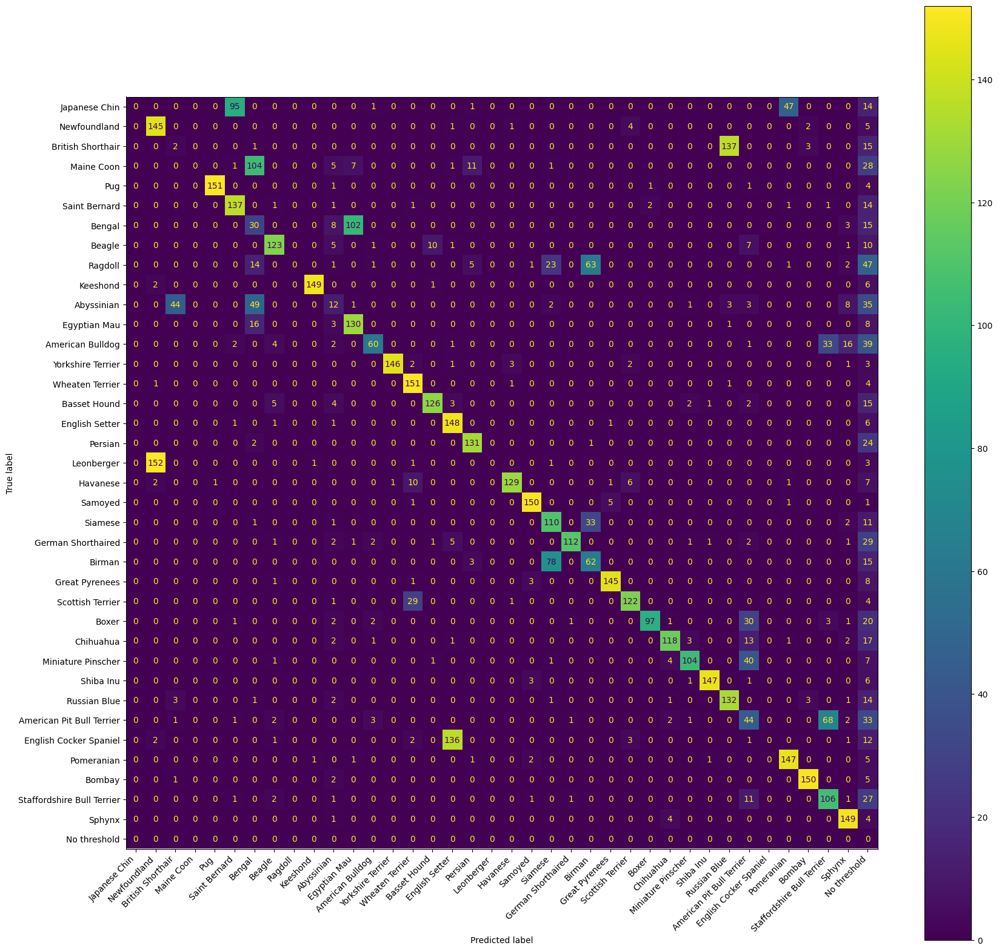

[1,  2000] loss: 0.021
[1,  4000] loss: 0.021
[1,  7375] loss: 0.016
Finished Training
Accuracy on test data: 0.6364251861882194


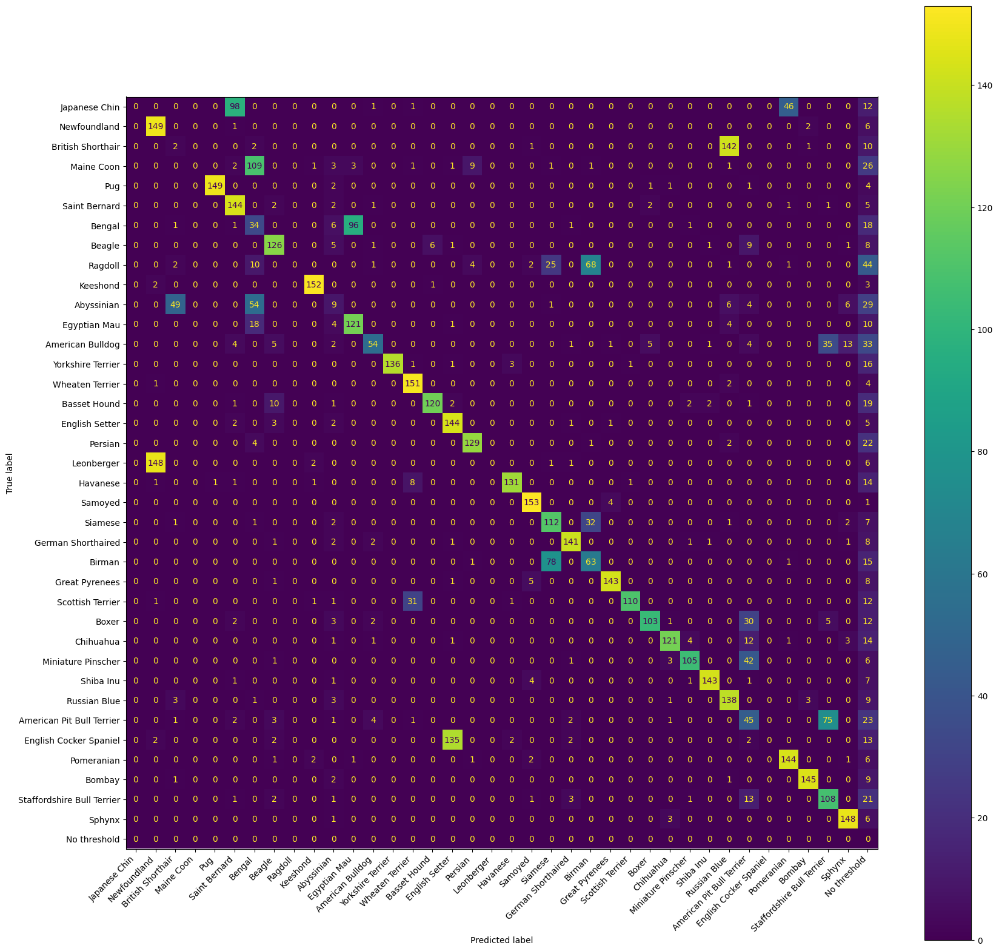

[1,  2000] loss: 0.021
[1,  4000] loss: 0.021
[1,  7425] loss: 0.015
Finished Training
Accuracy on test data: 0.6459038591740014


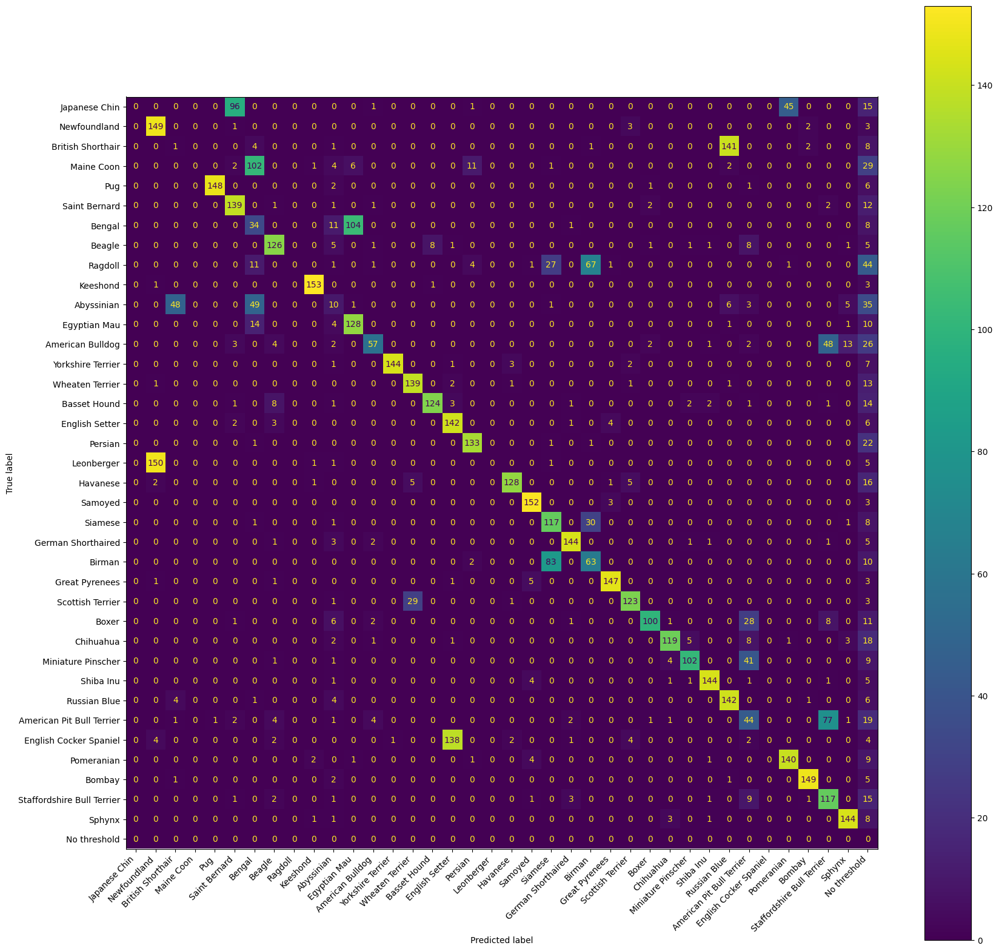

[1,  2000] loss: 0.020
[1,  4000] loss: 0.022
[1,  7450] loss: 0.015
Finished Training
Accuracy on test data: 0.6357481381178064


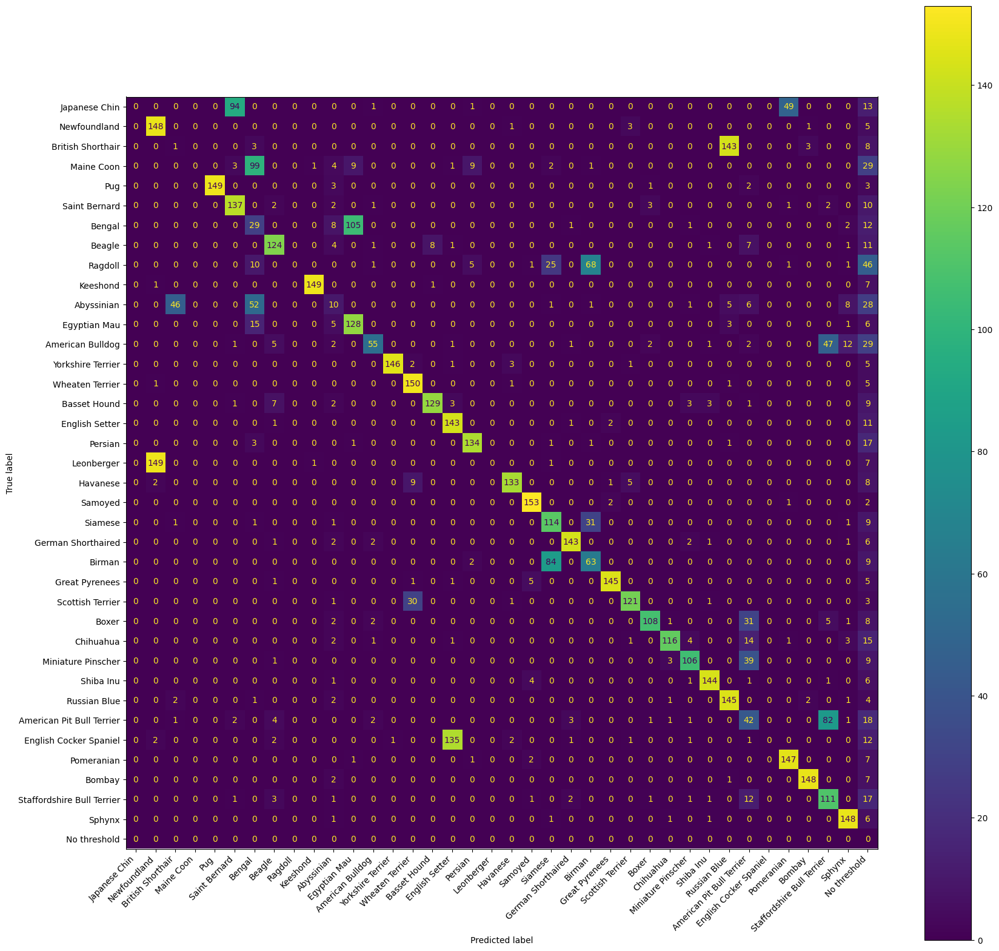

[1,  2000] loss: 0.019
[1,  4000] loss: 0.020
[1,  7475] loss: 0.014
Finished Training
Accuracy on test data: 0.6411645226811103


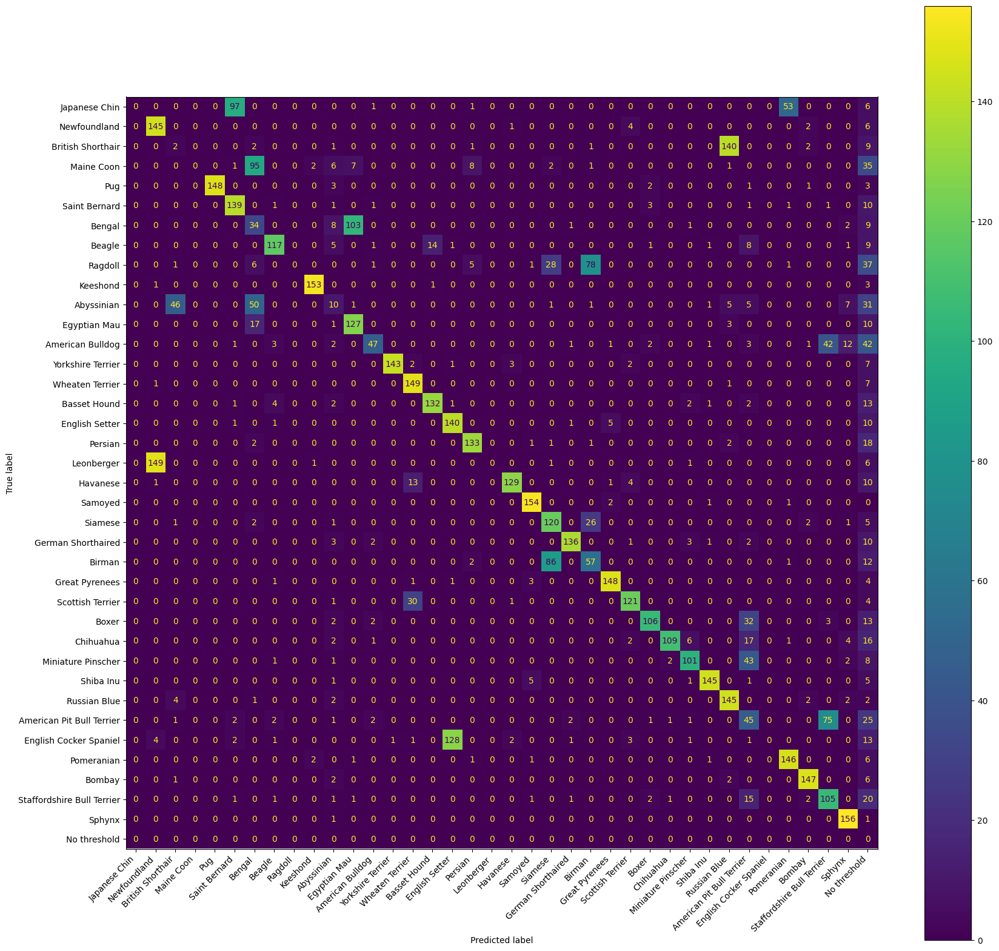

[1,  2000] loss: 0.019
[1,  4000] loss: 0.020
[1,  7450] loss: 0.014
Finished Training
Accuracy on test data: 0.6418415707515234


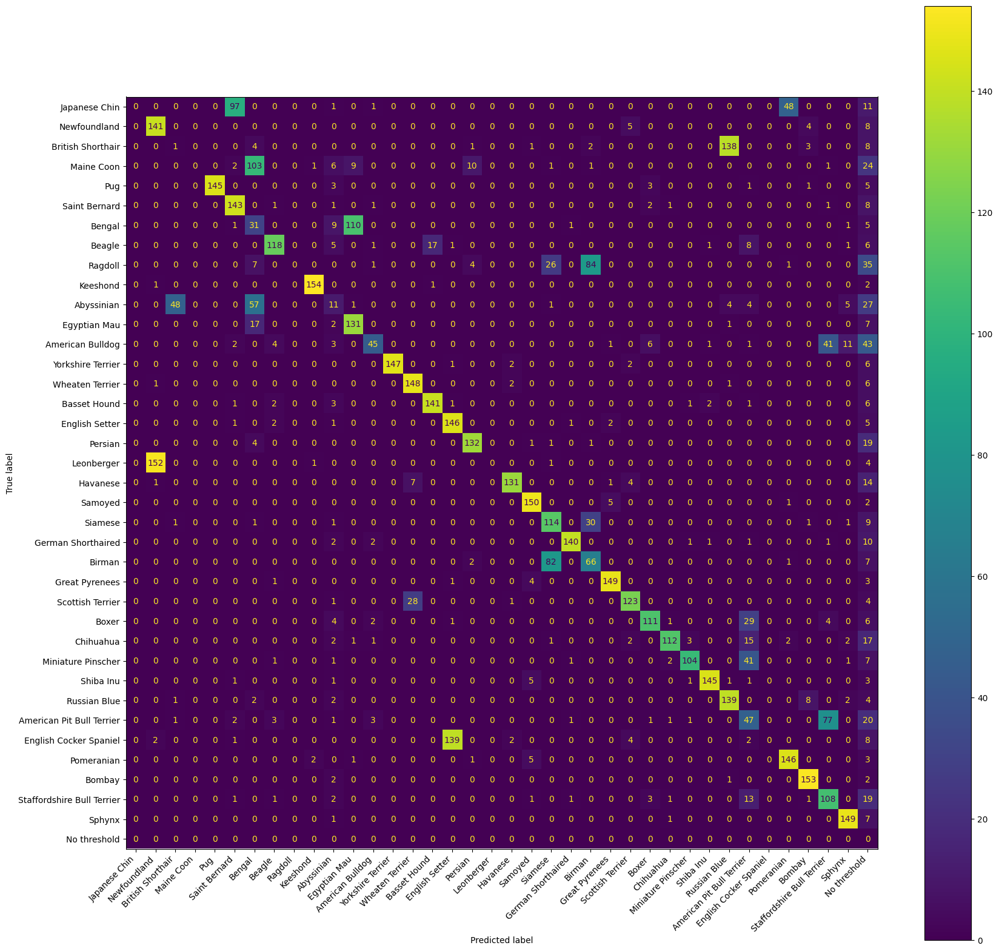

KeyboardInterrupt: 

In [14]:
main(unlabeled_percentage=0.99, extra_layers=[], epochs=10, enable_batch_norm=True, prediction_threshold=0.45)